# Import libraries 

In [1]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
sns.set(style="whitegrid")
pd.set_option('display.max_columns',None)
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from tqdm import tqdm

import warnings
warnings.filterwarnings('ignore')


## Reading data

In [2]:
df=pd.read_csv("OnlineRetail.csv", encoding = 'unicode_escape')
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,01-12-2010 08:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,01-12-2010 08:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,01-12-2010 08:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,01-12-2010 08:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,01-12-2010 08:26,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,09-12-2011 12:50,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,09-12-2011 12:50,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,09-12-2011 12:50,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,09-12-2011 12:50,4.15,12680.0,France


In [3]:
#Dataframe summary
pd.DataFrame({'unicos':df.nunique(),
              'missing': df.isna().sum(),
              'tipo':df.dtypes})

,unicos,missing,tipo
InvoiceNo,25900,0,object
StockCode,4070,0,object
Description,4223,1454,object
Quantity,722,0,int64
InvoiceDate,23260,0,object
UnitPrice,1630,0,float64
CustomerID,4372,135080,float64
Country,38,0,object


In [4]:
df.describe()

,Quantity,UnitPrice,CustomerID
count,541909.000000,541909.000000,406829.000000
mean,9.552250,4.611114,15287.690570
std,218.081158,96.759853,1713.600303
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,13953.000000
50%,3.000000,2.080000,15152.000000
75%,10.000000,4.130000,16791.000000
max,80995.000000,38970.000000,18287.000000


# data cleaning

### Abnormal Values

In [5]:
# data of Quantity when is <=0
df[df["Quantity"]<=0]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
141,C536379,D,Discount,-1,01-12-2010 09:41,27.50,14527.0,United Kingdom
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,01-12-2010 09:49,4.65,15311.0,United Kingdom
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,01-12-2010 10:24,1.65,17548.0,United Kingdom
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,01-12-2010 10:24,0.29,17548.0,United Kingdom
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,01-12-2010 10:24,0.29,17548.0,United Kingdom
...,...,...,...,...,...,...,...,...
540449,C581490,23144,ZINC T-LIGHT HOLDER STARS SMALL,-11,09-12-2011 09:57,0.83,14397.0,United Kingdom
541541,C581499,M,Manual,-1,09-12-2011 10:28,224.69,15498.0,United Kingdom
541715,C581568,21258,VICTORIAN SEWING BOX LARGE,-5,09-12-2011 11:57,10.95,15311.0,United Kingdom
541716,C581569,84978,HANGING HEART JAR T-LIGHT HOLDER,-1,09-12-2011 11:58,1.25,17315.0,United Kingdom


In [6]:
# data of UnitPrice when is <=0
df[df["UnitPrice"]<=0]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
622,536414,22139,NaN,56,01-12-2010 11:52,0.0,NaN,United Kingdom
1970,536545,21134,NaN,1,01-12-2010 14:32,0.0,NaN,United Kingdom
1971,536546,22145,NaN,1,01-12-2010 14:33,0.0,NaN,United Kingdom
1972,536547,37509,NaN,1,01-12-2010 14:33,0.0,NaN,United Kingdom
1987,536549,85226A,NaN,1,01-12-2010 14:34,0.0,NaN,United Kingdom
...,...,...,...,...,...,...,...,...
536981,581234,72817,NaN,27,08-12-2011 10:33,0.0,NaN,United Kingdom
538504,581406,46000M,POLYESTER FILLER PAD 45x45cm,240,08-12-2011 13:58,0.0,NaN,United Kingdom
538505,581406,46000S,POLYESTER FILLER PAD 40x40cm,300,08-12-2011 13:58,0.0,NaN,United Kingdom
538554,581408,85175,NaN,20,08-12-2011 14:06,0.0,NaN,United Kingdom


In [7]:
wrongindices=[]
wrongindices=list(df[df["Quantity"]<=0].index)
wrongindices.extend(list(df[df["UnitPrice"]<=0].index))
len(wrongindices),len(set(wrongindices))

(13141, 11805)

In [8]:
wrongindices=set(wrongindices)

In [9]:
df.drop(wrongindices,axis=0,inplace=True)
df.reset_index(inplace=True)
df.drop("index",axis=1,inplace=True)
df.shape

(530104, 8)

In [10]:
df.describe()

,Quantity,UnitPrice,CustomerID
count,530104.000000,530104.000000,397884.000000
mean,10.542037,3.907625,15294.423453
std,155.524124,35.915681,1713.141560
min,1.000000,0.001000,12346.000000
25%,1.000000,1.250000,13969.000000
50%,3.000000,2.080000,15159.000000
75%,10.000000,4.130000,16795.000000
max,80995.000000,13541.330000,18287.000000


### Nulls

In [11]:
df.isna().sum()

InvoiceNo           0
StockCode           0
Description         0
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     132220
Country             0
dtype: int64

In [12]:
'No ID' in df['CustomerID']

False

In [13]:
df['CustomerID'].fillna('No ID',inplace=True)

In [14]:
df['CustomerID'].isna().sum()

0

In [15]:
#extrac feature from CustomerID as Member or not
df['Member']=df['CustomerID'].apply(lambda x:0 if x=='No ID' else 1)

In [16]:
df['Member'].value_counts()

1    397884
0    132220
Name: Member, dtype: int64

In [17]:
df[df['Member']==0][["InvoiceNo","StockCode"]]

,InvoiceNo,StockCode
1430,536544,21773
1431,536544,21774
1432,536544,21786
1433,536544,21787
1434,536544,21790
...,...,...
529735,581498,85099B
529736,581498,85099C
529737,581498,85150
529738,581498,85174


In [18]:
# Data of duplicated
df[df.duplicated()]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Member
508,536409,21866,UNION JACK FLAG LUGGAGE TAG,1,01-12-2010 11:45,1.25,17908,United Kingdom,1
518,536409,22866,HAND WARMER SCOTTY DOG DESIGN,1,01-12-2010 11:45,2.10,17908,United Kingdom,1
528,536409,22900,SET 2 TEA TOWELS I LOVE LONDON,1,01-12-2010 11:45,2.95,17908,United Kingdom,1
530,536409,22111,SCOTTIE DOG HOT WATER BOTTLE,1,01-12-2010 11:45,4.95,17908,United Kingdom,1
546,536412,22327,ROUND SNACK BOXES SET OF 4 SKULLS,1,01-12-2010 11:49,2.95,17920,United Kingdom,1
...,...,...,...,...,...,...,...,...,...
529873,581538,22068,BLACK PIRATE TREASURE CHEST,1,09-12-2011 11:34,0.39,14446,United Kingdom,1
529887,581538,23318,BOX OF 6 MINI VINTAGE CRACKERS,1,09-12-2011 11:34,2.49,14446,United Kingdom,1
529890,581538,22992,REVOLVER WOODEN RULER,1,09-12-2011 11:34,1.95,14446,United Kingdom,1
529897,581538,22694,WICKER STAR,1,09-12-2011 11:34,2.10,14446,United Kingdom,1


In [19]:
df.drop_duplicates(inplace=True)
df.reset_index(inplace=True)
df.drop(['index'],axis = 1,inplace=True)
df.shape

(524878, 9)

# Data Processing

In [20]:
pd.DataFrame({'unicos':df.nunique(),
              'missing': df.isna().sum(),
              'tipo':df.dtypes})

,unicos,missing,tipo
InvoiceNo,19960,0,object
StockCode,3922,0,object
Description,4026,0,object
Quantity,375,0,int64
InvoiceDate,18499,0,object
UnitPrice,1291,0,float64
CustomerID,4339,0,object
Country,38,0,object
Member,2,0,int64


In [21]:
#InvoiceDate
#convert from object to datatime
df["InvoiceDate"]=pd.to_datetime(df["InvoiceDate"],format="%d-%m-%Y %H:%M")

In [22]:
df["Year"]=df["InvoiceDate"].dt.year
df["Month"]=df["InvoiceDate"].dt.month
df["Hour"]=df["InvoiceDate"].dt.hour
df["Day"]=df["InvoiceDate"].dt.day
df["WeekDay"]=df["InvoiceDate"].dt.day_name()
df['WeekDayCase'] = df['WeekDay'].apply(lambda x : 'WeekEnd' if str(x).lower() in ['saturday','sunday'] else 'WeekDay')



In [23]:
df[["InvoiceDate","Year","Day","WeekDay","Month","Hour"]]

,InvoiceDate,Year,Day,WeekDay,Month,Hour
0,2010-12-01 08:26:00,2010,1,Wednesday,12,8
1,2010-12-01 08:26:00,2010,1,Wednesday,12,8
2,2010-12-01 08:26:00,2010,1,Wednesday,12,8
3,2010-12-01 08:26:00,2010,1,Wednesday,12,8
4,2010-12-01 08:26:00,2010,1,Wednesday,12,8
...,...,...,...,...,...,...
524873,2011-12-09 12:50:00,2011,9,Friday,12,12
524874,2011-12-09 12:50:00,2011,9,Friday,12,12
524875,2011-12-09 12:50:00,2011,9,Friday,12,12
524876,2011-12-09 12:50:00,2011,9,Friday,12,12


In [24]:
df["WeekDay"].value_counts()

Thursday     100213
Tuesday       98726
Monday        92466
Wednesday     91467
Friday        79667
Sunday        62339
Name: WeekDay, dtype: int64

In [25]:
df['WeekDayCase'].value_counts()

WeekDay    462539
WeekEnd     62339
Name: WeekDayCase, dtype: int64

In [26]:
def DayPart(H) :
    
    if H <6 : 
        return 'Early Morning'
    elif H< 12 : 
        return 'Morning'
    elif  H< 15 : 
        return 'Noon'
    elif H< 19 : 
        return 'Evening'
    else : 
        return 'Night'

In [27]:
df['DayPart'] = df['Hour'].apply(lambda x : DayPart(int(x)))

In [28]:
df['DayPart'].value_counts()

Noon       211036
Evening    163759
Morning    145878
Night        4205
Name: DayPart, dtype: int64

In [29]:
#Description
df['Desc Char Length'] = df['Description'].apply(lambda x :  len(x))
df['Desc Word Length'] = df['Description'].apply(lambda x :  len(x.split()))
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Member,Year,Month,Hour,Day,WeekDay,WeekDayCase,DayPart,Desc Char Length,Desc Word Length
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,34,5
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,19,3
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,30,5
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,35,6
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,30,5


In [30]:
AllDescription =" ".join(df["Description"].tolist())
AllDescription=" ".join(i.lower() for i in AllDescription.split())
AllDescription[:33]

'white hanging heart t-light holde'

In [31]:
MostRepeatedWords = {}
for word in AllDescription.split():
    if word in MostRepeatedWords.keys():
        MostRepeatedWords[word]+=1
    else:
        MostRepeatedWords[word]=1

In [32]:
MostRepeatedWords

{'white': 20198,
 'hanging': 16452,
 'heart': 37841,
 't-light': 14063,
 'holder': 15710,
 'metal': 20396,
 'lantern': 2270,
 'cream': 7760,
 'cupid': 333,
 'hearts': 4910,
 'coat': 1570,
 'hanger': 2145,
 'knitted': 786,
 'union': 5344,
 'flag': 1745,
 'hot': 10293,
 'water': 9771,
 'bottle': 11463,
 'red': 41742,
 'woolly': 438,
 'hottie': 438,
 'heart.': 438,
 'set': 53069,
 '7': 623,
 'babushka': 3155,
 'nesting': 498,
 'boxes': 3145,
 'glass': 11527,
 'star': 5948,
 'frosted': 154,
 'hand': 4796,
 'warmer': 4479,
 'jack': 3723,
 'polka': 194,
 'dot': 107,
 'assorted': 7359,
 'colour': 6040,
 'bird': 5743,
 'ornament': 1476,
 "poppy's": 1422,
 'playhouse': 1422,
 'bedroom': 425,
 'kitchen': 3455,
 'feltcraft': 7041,
 'princess': 1164,
 'charlotte': 6213,
 'doll': 2183,
 'ivory': 7943,
 'mug': 7917,
 'cosy': 1276,
 'box': 23554,
 'of': 52015,
 '6': 12865,
 'teaspoons': 210,
 'vintage': 32964,
 'jigsaw': 1623,
 'blocks': 502,
 'alphabet': 3830,
 'home': 9275,
 'building': 1686,
 'blo

In [33]:
len(MostRepeatedWords.keys())

2351

In [34]:
MostRepeatedWords={k:v for k,v in sorted(MostRepeatedWords.items(),key = lambda item: item[1],reverse=True)}
    

In [35]:
MostRepeatedWords

{'set': 53069,
 'of': 52015,
 'bag': 50823,
 'red': 41742,
 'heart': 37841,
 'retrospot': 34124,
 'vintage': 32964,
 'design': 29200,
 'pink': 28869,
 'christmas': 24587,
 'box': 23554,
 'jumbo': 20724,
 'cake': 20681,
 'metal': 20396,
 'white': 20198,
 'blue': 18804,
 'lunch': 18007,
 '3': 17893,
 'sign': 16677,
 'hanging': 16452,
 'holder': 15710,
 'pack': 15319,
 'paper': 14135,
 't-light': 14063,
 'small': 13945,
 'card': 13058,
 '6': 12865,
 'decoration': 12716,
 'wooden': 12435,
 'polkadot': 12228,
 'cases': 11721,
 'glass': 11527,
 'tea': 11519,
 'bottle': 11463,
 '12': 11191,
 'in': 10959,
 'and': 10606,
 'spaceboy': 10570,
 'hot': 10293,
 'water': 9771,
 'with': 9519,
 'large': 9428,
 'pantry': 9403,
 'home': 9275,
 'tin': 9191,
 'rose': 9163,
 'paisley': 9149,
 '4': 8925,
 'green': 8865,
 'ceramic': 8757,
 'regency': 8613,
 'doormat': 8255,
 'dolly': 8221,
 'mini': 7970,
 'ivory': 7943,
 'mug': 7917,
 'bunting': 7881,
 'love': 7793,
 'cream': 7760,
 'girl': 7601,
 'party': 74

In [36]:
ImportantWords = ['bag','red','heart','retrospot','vintage','design','pink','christmas','box','kitchen'] 

In [37]:
GuessedWords  = ['car','electric','kitchen','electronic']

for Word in GuessedWords : 
    if Word in MostRepeatedWords.keys():
        print(f'for Word {Word} repeated {MostRepeatedWords[Word]}')

for Word car repeated 184
for Word kitchen repeated 3455
for Word electronic repeated 2


In [38]:
for Word in ImportantWords : 
    df[f'Repeated Word : {Word}'] = df['Description'].apply(lambda x : 1 if Word in x.lower() else 0)

In [39]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Member,Year,Month,Hour,Day,WeekDay,WeekDayCase,DayPart,Desc Char Length,Desc Word Length,Repeated Word : bag,Repeated Word : red,Repeated Word : heart,Repeated Word : retrospot,Repeated Word : vintage,Repeated Word : design,Repeated Word : pink,Repeated Word : christmas,Repeated Word : box,Repeated Word : kitchen
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,34,5,0,0,1,0,0,0,0,0,0,0
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,19,3,0,0,0,0,0,0,0,0,0,0
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,30,5,0,0,1,0,0,0,0,0,0,0
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,35,6,0,0,0,0,0,0,0,0,0,0
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,30,5,0,1,1,0,0,0,0,0,0,0


In [40]:
df[df['Repeated Word : red']==1]['Description']

4           RED WOOLLY HOTTIE WHITE HEART.
8                HAND WARMER RED POLKA DOT
22             RED COAT RACK PARIS FASHION
27               ALARM CLOCK BAKELIKE RED 
33         SET/2 RED RETROSPOT TEA TOWELS 
                        ...               
524836    RED FLOCK LOVE HEART PHOTO FRAME
524849           ALARM CLOCK BAKELIKE RED 
524861       RED RETROSPOT ROUND CAKE TINS
524862               DOORMAT RED RETROSPOT
524867           ALARM CLOCK BAKELIKE RED 
Name: Description, Length: 44727, dtype: object

In [41]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Member,Year,Month,Hour,Day,WeekDay,WeekDayCase,DayPart,Desc Char Length,Desc Word Length,Repeated Word : bag,Repeated Word : red,Repeated Word : heart,Repeated Word : retrospot,Repeated Word : vintage,Repeated Word : design,Repeated Word : pink,Repeated Word : christmas,Repeated Word : box,Repeated Word : kitchen
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,34,5,0,0,1,0,0,0,0,0,0,0
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,19,3,0,0,0,0,0,0,0,0,0,0
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,30,5,0,0,1,0,0,0,0,0,0,0
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,35,6,0,0,0,0,0,0,0,0,0,0
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,30,5,0,1,1,0,0,0,0,0,0,0


In [42]:
#Country
df['Country'].unique()

array(['United Kingdom', 'France', 'Australia', 'Netherlands', 'Germany',
       'Norway', 'EIRE', 'Switzerland', 'Spain', 'Poland', 'Portugal',
       'Italy', 'Belgium', 'Lithuania', 'Japan', 'Iceland',
       'Channel Islands', 'Denmark', 'Cyprus', 'Sweden', 'Finland',
       'Austria', 'Bahrain', 'Israel', 'Greece', 'Hong Kong', 'Singapore',
       'Lebanon', 'United Arab Emirates', 'Saudi Arabia',
       'Czech Republic', 'Canada', 'Unspecified', 'Brazil', 'USA',
       'European Community', 'Malta', 'RSA'], dtype=object)

In [43]:
ContinentsDict = {'Europe':['United Kingdom','France','Netherlands','Germany','Norway'
                            ,'EIRE','Switzerland','Spain', 'Poland', 'Portugal','Italy'
                            ,'Belgium','Lithuania','Iceland','Channel Islands','Denmark'
                            ,'Cyprus','Sweden','Finland','Austria','Greece','Czech Republic'
                            ,'European Community','Malta'],
              'Asia':['Japan','Bahrain','Israel','Hong Kong','Singapore','Lebanon',
                      'United Arab Emirates','Saudi Arabia'],
              'Americans':['Canada',  'Brazil', 'USA'],
              'Other':['Australia','Unspecified','RSA']}

In [44]:
def GetContinent(Country) : 
    global ContinentsDict
    for Key in ContinentsDict.keys() : 
        if Country in ContinentsDict[Key] : 
            return Key

In [45]:
df['Continent'] = df['Country'].apply(lambda x: GetContinent(x))

In [46]:
df['Continent'].value_counts()

Europe       521581
Other          1680
Asia           1255
Americans       362
Name: Continent, dtype: int64

In [47]:
from geopy.geocoders import Nominatim
from countryinfo import CountryInfo
geolocator = Nominatim(user_agent="catuserbot")

In [48]:
CapitalsDict = {}

for Country in df['Country'].unique() : 
    try : 
        CapitalsDict[Country] = CountryInfo(Country).capital()
    except :
        print(Country)
CapitalsDict  

EIRE
Channel Islands
Unspecified
European Community


{'United Kingdom': 'London',
 'France': 'Paris',
 'Australia': 'Canberra',
 'Netherlands': 'Amsterdam',
 'Germany': 'Berlin',
 'Norway': 'Oslo',
 'Switzerland': 'Bern',
 'Spain': 'Madrid',
 'Poland': 'Warsaw',
 'Portugal': 'Lisbon',
 'Italy': 'Rome',
 'Belgium': 'Brussels',
 'Lithuania': 'Vilnius',
 'Japan': 'Tokyo',
 'Iceland': 'Reykjavik',
 'Denmark': 'Copenhagen',
 'Cyprus': 'Nicosia',
 'Sweden': 'Stockholm',
 'Finland': 'Helsinki',
 'Austria': 'Vienna',
 'Bahrain': 'Manama',
 'Israel': 'Jerusalem',
 'Greece': 'Athens',
 'Hong Kong': 'City of Victoria',
 'Singapore': 'Singapore',
 'Lebanon': 'Beirut',
 'United Arab Emirates': 'Abu Dhabi',
 'Saudi Arabia': 'Riyadh',
 'Czech Republic': 'Prague',
 'Canada': 'Ottawa',
 'Brazil': 'Brasília',
 'USA': 'Washington D.C.',
 'Malta': 'Valletta',
 'RSA': 'Pretoria'}

In [49]:
CapitalsDict["EIRE"]='Dublin'
CapitalsDict["Channel Islands"]="Peter Port"
CapitalsDict


{'United Kingdom': 'London',
 'France': 'Paris',
 'Australia': 'Canberra',
 'Netherlands': 'Amsterdam',
 'Germany': 'Berlin',
 'Norway': 'Oslo',
 'Switzerland': 'Bern',
 'Spain': 'Madrid',
 'Poland': 'Warsaw',
 'Portugal': 'Lisbon',
 'Italy': 'Rome',
 'Belgium': 'Brussels',
 'Lithuania': 'Vilnius',
 'Japan': 'Tokyo',
 'Iceland': 'Reykjavik',
 'Denmark': 'Copenhagen',
 'Cyprus': 'Nicosia',
 'Sweden': 'Stockholm',
 'Finland': 'Helsinki',
 'Austria': 'Vienna',
 'Bahrain': 'Manama',
 'Israel': 'Jerusalem',
 'Greece': 'Athens',
 'Hong Kong': 'City of Victoria',
 'Singapore': 'Singapore',
 'Lebanon': 'Beirut',
 'United Arab Emirates': 'Abu Dhabi',
 'Saudi Arabia': 'Riyadh',
 'Czech Republic': 'Prague',
 'Canada': 'Ottawa',
 'Brazil': 'Brasília',
 'USA': 'Washington D.C.',
 'Malta': 'Valletta',
 'RSA': 'Pretoria',
 'EIRE': 'Dublin',
 'Channel Islands': 'Peter Port'}

In [50]:
def GeoLocate(country):
    try:
        loc = geolocator.geocode(country)
        return (loc.latitude, loc.longitude)
    except:
        return np.nan

In [51]:
LocationDict = {}
for Country in CapitalsDict.keys() : 
    a,b = GeoLocate(CapitalsDict[Country])
    LocationDict[Country] = [a,b]
LocationDict 

{'United Kingdom': [51.5073219, -0.1276474],
 'France': [48.8588897, 2.3200410217200766],
 'Australia': [-35.2975906, 149.1012676],
 'Netherlands': [52.3727598, 4.8936041],
 'Germany': [52.5186925, 13.3996024],
 'Norway': [59.9133301, 10.7389701],
 'Switzerland': [46.9482713, 7.4514512],
 'Spain': [40.4167047, -3.7035825],
 'Poland': [52.2337172, 21.071432235636493],
 'Portugal': [38.7077507, -9.1365919],
 'Italy': [41.8933203, 12.4829321],
 'Belgium': [50.8465573, 4.351697],
 'Lithuania': [54.6870458, 25.2829111],
 'Japan': [35.6828387, 139.7594549],
 'Iceland': [64.145981, -21.9422367],
 'Denmark': [55.6867243, 12.5700724],
 'Cyprus': [35.1748976, 33.3638568],
 'Sweden': [59.3251172, 18.0710935],
 'Finland': [60.1674881, 24.9427473],
 'Austria': [48.2083537, 16.3725042],
 'Bahrain': [17.1750495, 95.9999652],
 'Israel': [31.79592425, 35.21198075969497],
 'Greece': [37.9839412, 23.7283052],
 'Hong Kong': [22.27658545, 114.1692984339808],
 'Singapore': [1.357107, 103.8194992],
 'Lebanon

In [52]:
[i for i in df['Country'].unique() if not i in LocationDict.keys()]

['Unspecified', 'European Community']

In [53]:
LocationDict['Unspecified'] = [0,0]
LocationDict['European Community'] = [51.5073219, -0.1276474]

LocationDict

{'United Kingdom': [51.5073219, -0.1276474],
 'France': [48.8588897, 2.3200410217200766],
 'Australia': [-35.2975906, 149.1012676],
 'Netherlands': [52.3727598, 4.8936041],
 'Germany': [52.5186925, 13.3996024],
 'Norway': [59.9133301, 10.7389701],
 'Switzerland': [46.9482713, 7.4514512],
 'Spain': [40.4167047, -3.7035825],
 'Poland': [52.2337172, 21.071432235636493],
 'Portugal': [38.7077507, -9.1365919],
 'Italy': [41.8933203, 12.4829321],
 'Belgium': [50.8465573, 4.351697],
 'Lithuania': [54.6870458, 25.2829111],
 'Japan': [35.6828387, 139.7594549],
 'Iceland': [64.145981, -21.9422367],
 'Denmark': [55.6867243, 12.5700724],
 'Cyprus': [35.1748976, 33.3638568],
 'Sweden': [59.3251172, 18.0710935],
 'Finland': [60.1674881, 24.9427473],
 'Austria': [48.2083537, 16.3725042],
 'Bahrain': [17.1750495, 95.9999652],
 'Israel': [31.79592425, 35.21198075969497],
 'Greece': [37.9839412, 23.7283052],
 'Hong Kong': [22.27658545, 114.1692984339808],
 'Singapore': [1.357107, 103.8194992],
 'Lebanon

In [54]:
LocationDict['European Community'][0]

51.5073219

In [55]:
df['Latt'] = df['Country'].apply(lambda x : LocationDict[x][0])
df['Long'] = df['Country'].apply(lambda x : LocationDict[x][1])
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Member,Year,Month,Hour,Day,WeekDay,WeekDayCase,DayPart,Desc Char Length,Desc Word Length,Repeated Word : bag,Repeated Word : red,Repeated Word : heart,Repeated Word : retrospot,Repeated Word : vintage,Repeated Word : design,Repeated Word : pink,Repeated Word : christmas,Repeated Word : box,Repeated Word : kitchen,Continent,Latt,Long
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,34,5,0,0,1,0,0,0,0,0,0,0,Europe,51.507322,-0.127647
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,19,3,0,0,0,0,0,0,0,0,0,0,Europe,51.507322,-0.127647
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,30,5,0,0,1,0,0,0,0,0,0,0,Europe,51.507322,-0.127647
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,35,6,0,0,0,0,0,0,0,0,0,0,Europe,51.507322,-0.127647
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,30,5,0,1,1,0,0,0,0,0,0,0,Europe,51.507322,-0.127647
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
524873,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680,France,1,2011,12,12,9,Friday,WeekDay,Noon,27,5,0,0,0,0,0,0,0,0,0,0,Europe,48.858890,2.320041
524874,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680,France,1,2011,12,12,9,Friday,WeekDay,Noon,28,4,0,0,0,0,0,0,0,0,0,0,Europe,48.858890,2.320041
524875,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680,France,1,2011,12,12,9,Friday,WeekDay,Noon,29,4,0,0,0,0,0,0,0,0,0,0,Europe,48.858890,2.320041
524876,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680,France,1,2011,12,12,9,Friday,WeekDay,Noon,31,4,0,0,0,0,0,0,0,0,0,0,Europe,48.858890,2.320041


In [56]:
#extract TotalPrice from Quantity and UnitPrice
df['TotalPrice'] = df.apply(lambda x : x['Quantity'] * x['UnitPrice'],axis=1)
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Member,Year,Month,Hour,Day,WeekDay,WeekDayCase,DayPart,Desc Char Length,Desc Word Length,Repeated Word : bag,Repeated Word : red,Repeated Word : heart,Repeated Word : retrospot,Repeated Word : vintage,Repeated Word : design,Repeated Word : pink,Repeated Word : christmas,Repeated Word : box,Repeated Word : kitchen,Continent,Latt,Long,TotalPrice
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,34,5,0,0,1,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,19,3,0,0,0,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,30,5,0,0,1,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,35,6,0,0,0,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,30,5,0,1,1,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,20.34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
524873,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680,France,1,2011,12,12,9,Friday,WeekDay,Noon,27,5,0,0,0,0,0,0,0,0,0,0,Europe,48.858890,2.320041,10.20
524874,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680,France,1,2011,12,12,9,Friday,WeekDay,Noon,28,4,0,0,0,0,0,0,0,0,0,0,Europe,48.858890,2.320041,12.60
524875,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680,France,1,2011,12,12,9,Friday,WeekDay,Noon,29,4,0,0,0,0,0,0,0,0,0,0,Europe,48.858890,2.320041,16.60
524876,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680,France,1,2011,12,12,9,Friday,WeekDay,Noon,31,4,0,0,0,0,0,0,0,0,0,0,Europe,48.858890,2.320041,16.60


In [57]:
#Quantity
df['Quantity'].min(),df['Quantity'].max()

(1, 80995)

In [58]:
def QuantityLevel(x) : 
    x = int(x)
    if x < 10 : 
        return 'Low'
    elif x <100 : 
        return 'Medium'
    else :
        return 'Huge'
df['Quantity Level'] =df['Quantity'] .apply(lambda x : QuantityLevel(x))
df['Quantity Level'].value_counts()

Low       370741
Medium    147485
Huge        6652
Name: Quantity Level, dtype: int64

In [59]:
df['UnitPrice'].min(),df['UnitPrice'].max()

(0.001, 13541.33)

In [60]:
def UnitPriceLevel(x) : 
    x = int(x)
    if x < 1 : 
        return 'Cheap'
    elif x <10 : 
        return 'Medium'
    else :
        return 'Expensive'
df['UnitPrice Level'] =df['UnitPrice'] .apply(lambda x : UnitPriceLevel(x))
df['UnitPrice Level'].value_counts()

Medium       391399
Cheap        109584
Expensive     23895
Name: UnitPrice Level, dtype: int64

In [61]:
df['TotalPrice'].min(),df['TotalPrice'].max()

(0.001, 168469.6)

In [62]:
def TotalPriceLevel(x) : 
    x = int(x)
    if x < 5 : 
        return 'Cheap'
    elif x <20 : 
        return 'Medium'
    else :
        return 'Expensive'
df['TotalPriceLevel'] =df['TotalPrice'] .apply(lambda x : TotalPriceLevel(x))
df['TotalPriceLevel'].value_counts()

Medium       253145
Cheap        170809
Expensive    100924
Name: TotalPriceLevel, dtype: int64

In [63]:
#InvoiceNo
df[df['InvoiceNo']=='536365']['StockCode'].unique()

array(['85123A', '71053', '84406B', '84029G', '84029E', '22752', '21730'],
      dtype=object)

In [64]:
import re

In [65]:
#for example
re.sub("\d+", "", 'abcd1234')

'abcd'

In [66]:
df['StockCode'].unique()

array(['85123A', '71053', '84406B', ..., '90214U', '47591b', '23843'],
      dtype=object)

In [67]:
df['StockCodeLetters'] = df['StockCode'].apply(lambda x :
                                                   re.sub("\d+", "", x).lower())
df['StockCodeLetters'].unique()

array(['a', '', 'b', 'g', 'e', 'post', 'l', 'c', 's', 'bl', 'n', 'd', 'f',
       't', 'h', 'm', 'p', 'j', 'r', 'dot', 'k', 'v', 'w', 'bank charges',
       'i', 'y', 'u', 'amazonfee', 'z', 'o', 'dcgs', 'gift__', 'dcgssboy',
       'dcgssgirl', 'pads'], dtype=object)

In [68]:
df['StockCodeLetters'].value_counts()

                472253
b                13751
a                12813
c                 6601
d                 3703
l                 2315
e                 2231
f                 1946
s                 1708
g                 1516
post              1126
m                  755
p                  751
dot                706
n                  686
k                  427
bl                 383
h                  375
j                  219
w                  179
u                  164
r                   90
v                   48
gift__              31
t                   15
i                   13
dcgssgirl           13
bank charges        12
dcgssboy            11
z                   10
dcgs                 9
y                    8
o                    5
pads                 3
amazonfee            2
Name: StockCodeLetters, dtype: int64

In [69]:
df['StockCodeOnlyDigits'] = df['StockCodeLetters'].apply(lambda x : 
                                                             'Yes' if x =='' 
                                                             else 'No')
df['StockCodeOnlyDigits'].value_counts()

Yes    472253
No      52625
Name: StockCodeOnlyDigits, dtype: int64

In [70]:
#extract season from Month
df["Month"].unique()

array([12,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11], dtype=int64)

In [71]:
SeasonsDict = {'Winter':[12,1,2],'Spring':[3,4,5],'Summer':[6,7,8],'Fall':[9,10,11]}
df['Season'] = df['Month'].apply(lambda x : [i for i in list(
    SeasonsDict.keys()) if int(x) in SeasonsDict[i]][0])
df['Season'].value_counts()

Fall      189441
Winter    126766
Summer    108375
Spring    100296
Name: Season, dtype: int64

In [72]:
df[df['Season']=='Fall']['Month'].unique()

array([ 9, 10, 11], dtype=int64)

In [73]:
df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'Member', 'Year', 'Month', 'Hour',
       'Day', 'WeekDay', 'WeekDayCase', 'DayPart', 'Desc Char Length',
       'Desc Word Length', 'Repeated Word : bag', 'Repeated Word : red',
       'Repeated Word : heart', 'Repeated Word : retrospot',
       'Repeated Word : vintage', 'Repeated Word : design',
       'Repeated Word : pink', 'Repeated Word : christmas',
       'Repeated Word : box', 'Repeated Word : kitchen', 'Continent', 'Latt',
       'Long', 'TotalPrice', 'Quantity Level', 'UnitPrice Level',
       'TotalPriceLevel', 'StockCodeLetters', 'StockCodeOnlyDigits', 'Season'],
      dtype='object')


# Data Visualization

In [74]:
#Visualization of countplot
def CPlot(feature) :
    global df
    fig, ax = plt.subplots(figsize=(10,6))
    sns.countplot(x=feature, data=df,facecolor=(0, 0, 0, 0),
                  linewidth=5,edgecolor=sns.color_palette("dark", 3))
    ax.set_xticklabels(ax.get_xticklabels(),rotation = 30)
    
#Visualization of kdeplot 
def KPlot(feature,Limit=0) :
    global df
    fig, ax = plt.subplots(figsize=(10,6))
    if Limit == 0 : 
        sns.kdeplot(df[feature], shade=True)
    else : 
        Data = df[df[feature]<=Limit]
        sns.kdeplot(Data[feature], shade=True)
        
#Visualization of boxplot               
def BPlot(feature1,feature2 = None,hue = None) :
    global df
    fig, ax = plt.subplots(figsize=(10,6))
    if feature2 ==  None and hue == None : 
        sns.boxplot(df[feature1],width=0.3,color='r')
    elif  feature2 !=  None and hue == None :
        sns.boxplot(x = df[feature1],y=df[feature2],width=0.3,color='r')
    elif  feature2 !=  None and hue != None :
        sns.boxplot(x = df[feature1],y=df[feature2],hue=df[hue],width=0.3,color='r')
        
#Visualization of jointplot               
def JPlot(feature1,feature2,Type = 'scatter') : 
    global df
    sns.jointplot(data=df[::1000], x=feature1, y=feature2, kind=Type)   
    
#Visualization of pie        
def Pie(feature,Limit=20) :
    global df
    fig, ax = plt.subplots(figsize=(10,6))
    plt.pie(df[feature].value_counts()[:Limit],labels=list(
        df[feature].value_counts()[:Limit].index),
        autopct ='%1.2f%%' , labeldistance = 1.1,
            explode = [0.05 for i in range(len(df[feature].value_counts()[:Limit]))] )
    plt.show()     

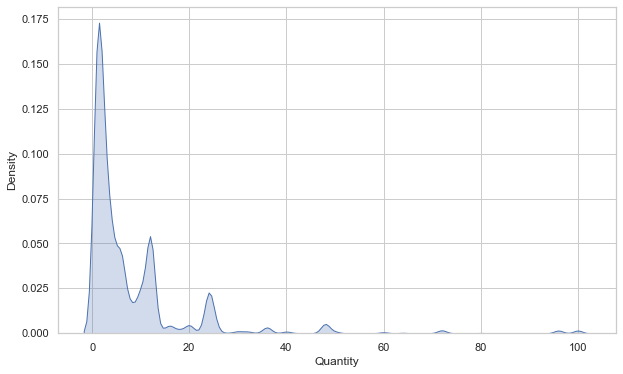

In [75]:
KPlot('Quantity',100)

In [76]:
df["UnitPrice"].max(),df["UnitPrice"].min()

(13541.33, 0.001)

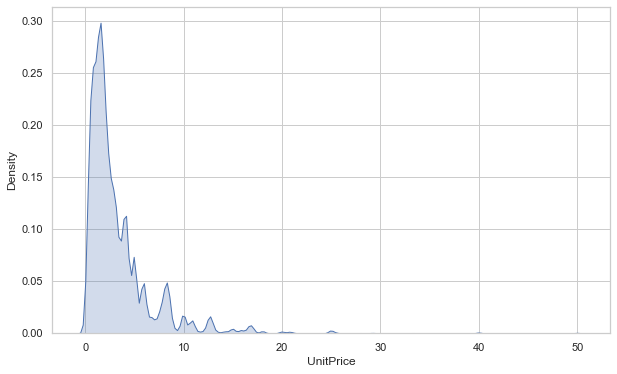

In [77]:
KPlot('UnitPrice',50)

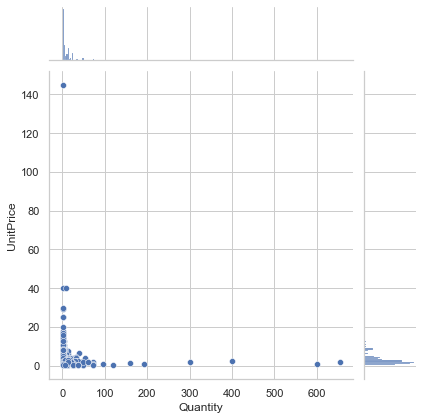

In [78]:
JPlot('Quantity','UnitPrice')

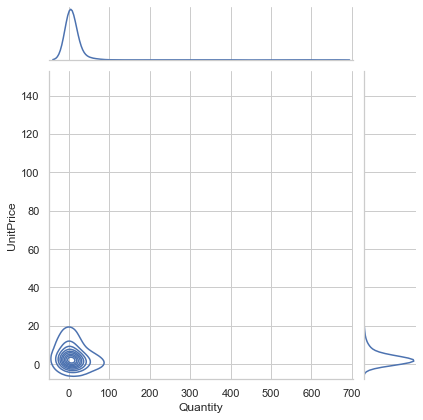

In [79]:
JPlot('Quantity','UnitPrice','kde')

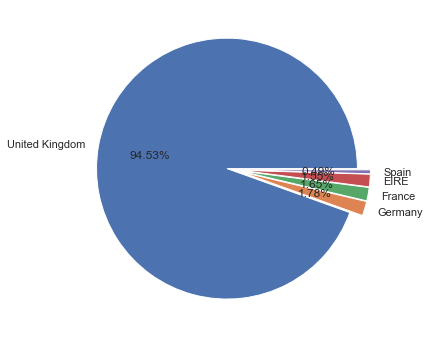

In [80]:
Pie('Country',5)

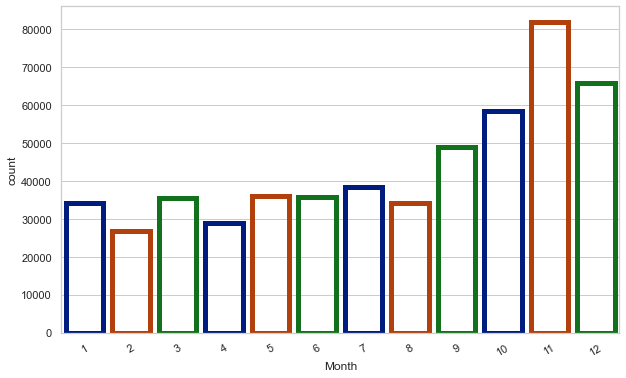

In [81]:
CPlot('Month')

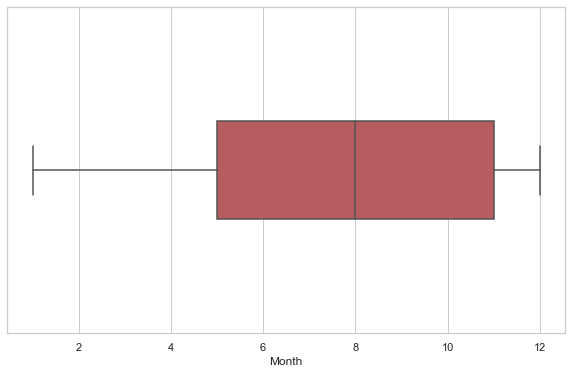

In [82]:
BPlot('Month')

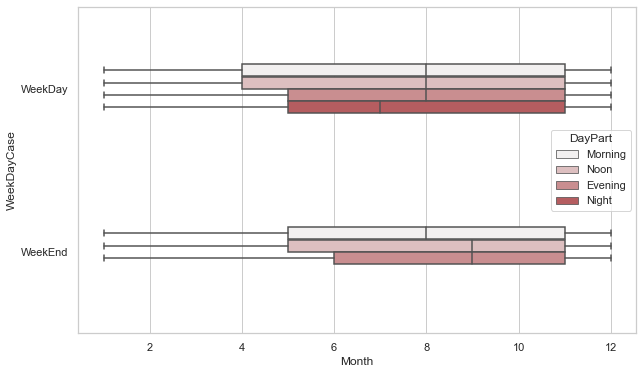

In [83]:
BPlot('Month','WeekDayCase','DayPart')

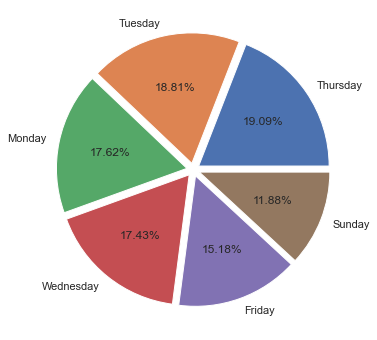

In [84]:
Pie('WeekDay')

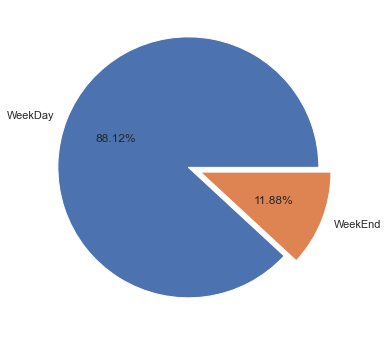

In [85]:
Pie('WeekDayCase')

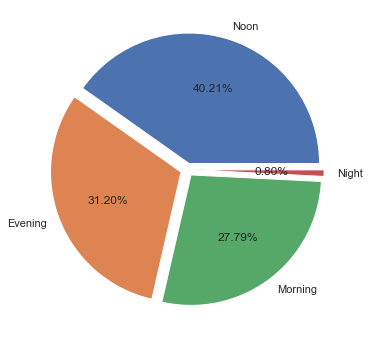

In [86]:
Pie('DayPart')

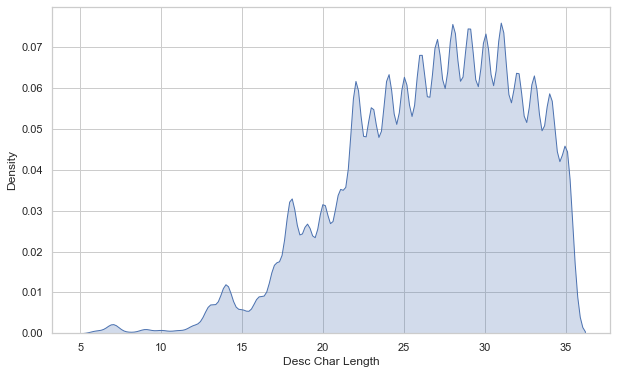

In [87]:
KPlot('Desc Char Length')

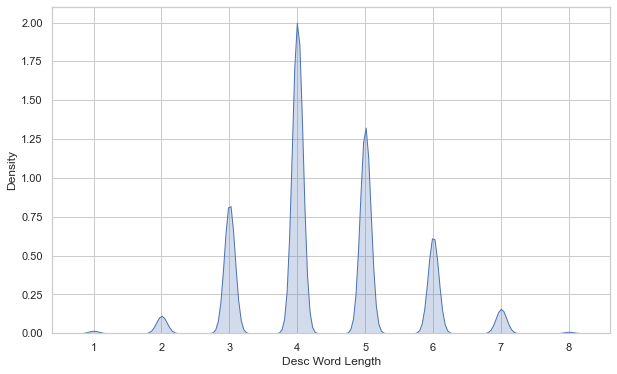

In [88]:
KPlot('Desc Word Length')

In [89]:
for c in df.columns:
    print(c)

InvoiceNo
StockCode
Description
Quantity
InvoiceDate
UnitPrice
CustomerID
Country
Member
Year
Month
Hour
Day
WeekDay
WeekDayCase
DayPart
Desc Char Length
Desc Word Length
Repeated Word : bag
Repeated Word : red
Repeated Word : heart
Repeated Word : retrospot
Repeated Word : vintage
Repeated Word : design
Repeated Word : pink
Repeated Word : christmas
Repeated Word : box
Repeated Word : kitchen
Continent
Latt
Long
TotalPrice
Quantity Level
UnitPrice Level
TotalPriceLevel
StockCodeLetters
StockCodeOnlyDigits
Season


In [90]:
WordFeaturesList = [c for c in df.columns if 'Word' in c]
WordFeaturesList

['Desc Word Length',
 'Repeated Word : bag',
 'Repeated Word : red',
 'Repeated Word : heart',
 'Repeated Word : retrospot',
 'Repeated Word : vintage',
 'Repeated Word : design',
 'Repeated Word : pink',
 'Repeated Word : christmas',
 'Repeated Word : box',
 'Repeated Word : kitchen']

In [91]:
WordFeaturesList.remove('Desc Word Length')
WordFeaturesList

['Repeated Word : bag',
 'Repeated Word : red',
 'Repeated Word : heart',
 'Repeated Word : retrospot',
 'Repeated Word : vintage',
 'Repeated Word : design',
 'Repeated Word : pink',
 'Repeated Word : christmas',
 'Repeated Word : box',
 'Repeated Word : kitchen']

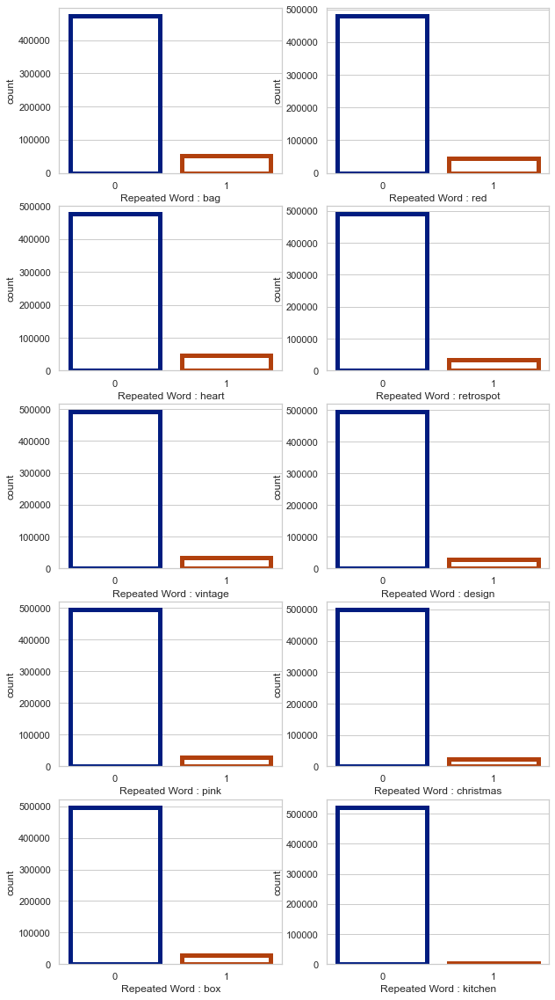

In [92]:
N = 0
fig, ax = plt.subplots(figsize=(10,20))
for i in range(5) : 
    for j in range(2) : 
        N+=1
        plt.subplot(5,2,N)
        sns.countplot(x=WordFeaturesList[N-1], data=df,facecolor=(0, 0, 0, 0),linewidth=5,edgecolor=sns.color_palette("dark", 3))

In [93]:
import folium
from folium.plugins import MarkerCluster

In [94]:
df.shape[0]

524878

In [95]:
df.iloc[66]['Latt']

51.5073219

In [96]:
world_map= folium.Map(tiles="cartodbpositron")
marker_cluster = MarkerCluster().add_to(world_map)
for i in tqdm(range(0,df.shape[0],50)):
        lat = df.iloc[i]['Latt']
        long = df.iloc[i]['Long']
        radius=5
        popup_text = "Country : {}<br> With Quantity : {}<br>"
        popup_text = popup_text.format(df.iloc[i]['Country'],df.iloc[i]['Quantity'])
        folium.CircleMarker(
            location = [lat, long], radius=radius,popup= popup_text,fill =True).add_to(marker_cluster)
world_map

100%|███████████████████████████████████| 10498/10498 [01:02<00:00, 166.76it/s]


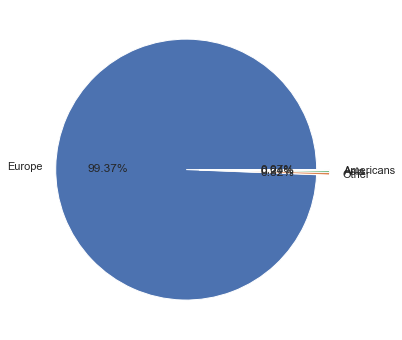

In [97]:
Pie('Continent')

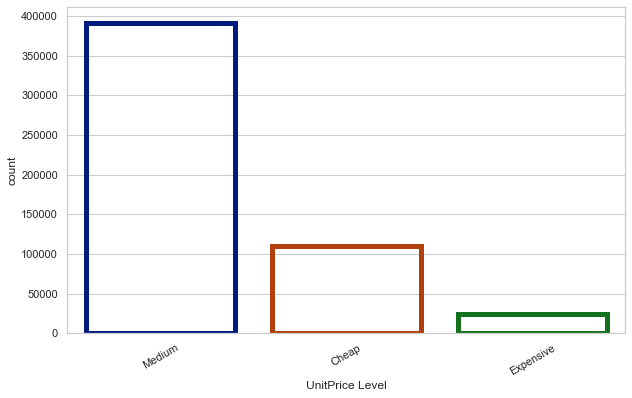

In [98]:
CPlot('UnitPrice Level')

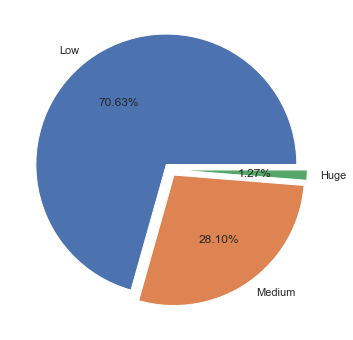

In [99]:
Pie('Quantity Level')

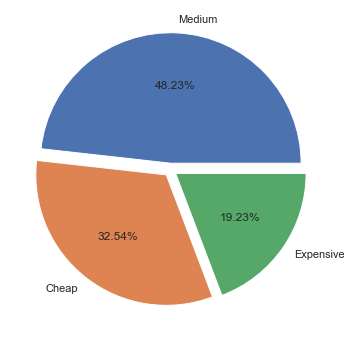

In [100]:
Pie('TotalPriceLevel')

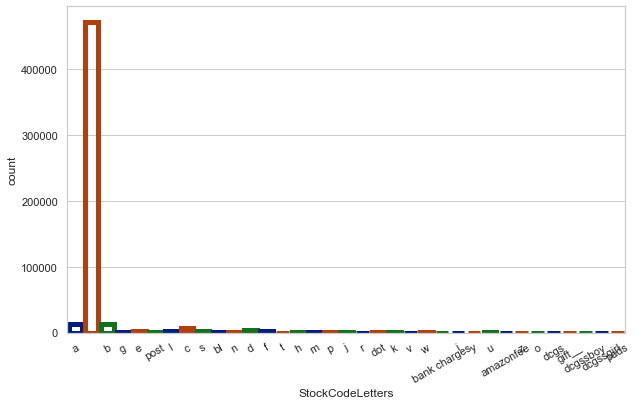

In [101]:
CPlot('StockCodeLetters')

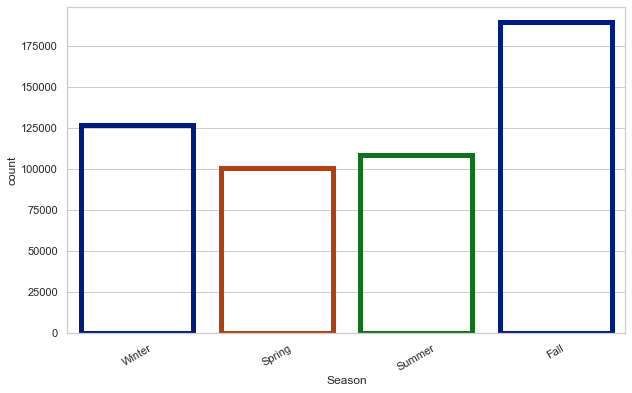

In [102]:
CPlot('Season')

In [103]:
def SelectedFeaturePie(data,feature,Limit=10) : 
    fig, ax = plt.subplots(figsize=(15,4))
    
    plt.subplot(1,4,1)
    plt.title('Summer')
    Data = data[data['Season']=='Summer']
    plt.pie(Data[feature].value_counts()[:Limit],labels=list(
        Data[feature].value_counts()[:Limit].index),
        autopct ='%1.2f%%' , labeldistance = 1.1,
            explode = [0.05 for i in range(len(Data[feature].value_counts()[:Limit]))] )
  
    plt.subplot(1,4,2)
    plt.title('Fall')
    Data = data[data['Season']=='Fall']
    plt.pie(Data[feature].value_counts()[:Limit],labels=list(
        Data[feature].value_counts()[:Limit].index),
        autopct ='%1.2f%%' , labeldistance = 1.1,explode = [0.05 for i in range(len(Data[feature].value_counts()[:Limit]))] )

    plt.subplot(1,4,3)
    plt.title('Winter')
    Data = data[data['Season']=='Winter']
    plt.pie(Data[feature].value_counts()[:Limit],labels=list(Data[feature].value_counts()[:Limit].index),
        autopct ='%1.2f%%' , labeldistance = 1.1,explode = [0.05 for i in range(len(Data[feature].value_counts()[:Limit]))] )

    plt.subplot(1,4,4)
    plt.title('Spring')
    Data = data[data['Season']=='Spring']
    plt.pie(Data[feature].value_counts()[:Limit],labels=list(Data[feature].value_counts()[:Limit].index),
        autopct ='%1.2f%%' , labeldistance = 1.1,explode = [0.05 for i in range(len(Data[feature].value_counts()[:Limit]))] )

    plt.show() 

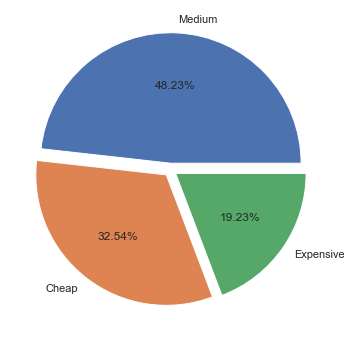

In [104]:
Pie('TotalPriceLevel')

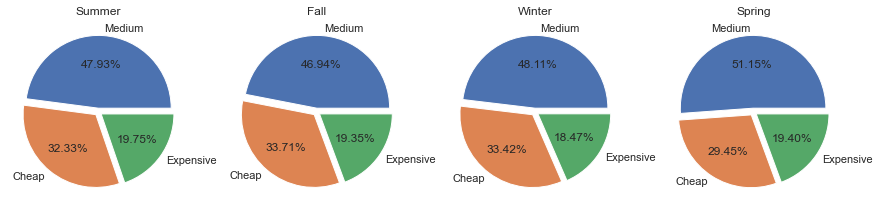

In [105]:
SelectedFeaturePie(df,'TotalPriceLevel')

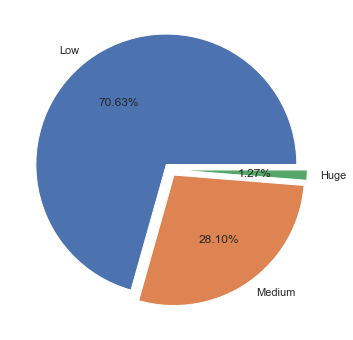

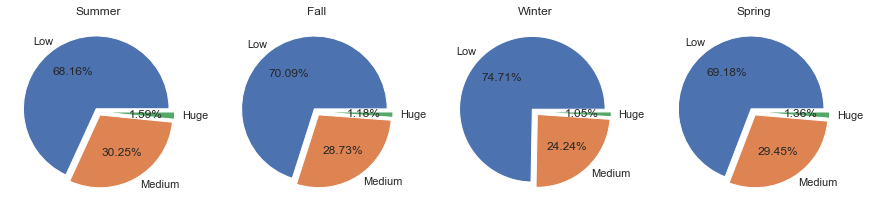

In [106]:
Pie('Quantity Level')
SelectedFeaturePie(df,'Quantity Level')

# Data Preparing

In [107]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Member,Year,Month,Hour,Day,WeekDay,WeekDayCase,DayPart,Desc Char Length,Desc Word Length,Repeated Word : bag,Repeated Word : red,Repeated Word : heart,Repeated Word : retrospot,Repeated Word : vintage,Repeated Word : design,Repeated Word : pink,Repeated Word : christmas,Repeated Word : box,Repeated Word : kitchen,Continent,Latt,Long,TotalPrice,Quantity Level,UnitPrice Level,TotalPriceLevel,StockCodeLetters,StockCodeOnlyDigits,Season
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,34,5,0,0,1,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,15.30,Low,Medium,Medium,a,No,Winter
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,19,3,0,0,0,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,20.34,Low,Medium,Expensive,,Yes,Winter
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,30,5,0,0,1,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,22.00,Low,Medium,Expensive,b,No,Winter
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,35,6,0,0,0,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,20.34,Low,Medium,Expensive,g,No,Winter
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,30,5,0,1,1,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,20.34,Low,Medium,Expensive,e,No,Winter


In [108]:
df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'Member', 'Year', 'Month', 'Hour',
       'Day', 'WeekDay', 'WeekDayCase', 'DayPart', 'Desc Char Length',
       'Desc Word Length', 'Repeated Word : bag', 'Repeated Word : red',
       'Repeated Word : heart', 'Repeated Word : retrospot',
       'Repeated Word : vintage', 'Repeated Word : design',
       'Repeated Word : pink', 'Repeated Word : christmas',
       'Repeated Word : box', 'Repeated Word : kitchen', 'Continent', 'Latt',
       'Long', 'TotalPrice', 'Quantity Level', 'UnitPrice Level',
       'TotalPriceLevel', 'StockCodeLetters', 'StockCodeOnlyDigits', 'Season'],
      dtype='object')

In [109]:
EncodedFeatures = ['Country','WeekDay','WeekDayCase','DayPart','Continent',
                   'Quantity Level','UnitPrice Level','TotalPriceLevel',
                   'StockCodeLetters','StockCodeOnlyDigits','Season']

In [110]:
df[EncodedFeatures]

,Country,WeekDay,WeekDayCase,DayPart,Continent,Quantity Level,UnitPrice Level,TotalPriceLevel,StockCodeLetters,StockCodeOnlyDigits,Season
0,United Kingdom,Wednesday,WeekDay,Morning,Europe,Low,Medium,Medium,a,No,Winter
1,United Kingdom,Wednesday,WeekDay,Morning,Europe,Low,Medium,Expensive,,Yes,Winter
2,United Kingdom,Wednesday,WeekDay,Morning,Europe,Low,Medium,Expensive,b,No,Winter
3,United Kingdom,Wednesday,WeekDay,Morning,Europe,Low,Medium,Expensive,g,No,Winter
4,United Kingdom,Wednesday,WeekDay,Morning,Europe,Low,Medium,Expensive,e,No,Winter
...,...,...,...,...,...,...,...,...,...,...,...
524873,France,Friday,WeekDay,Noon,Europe,Medium,Cheap,Medium,,Yes,Winter
524874,France,Friday,WeekDay,Noon,Europe,Low,Medium,Medium,,Yes,Winter
524875,France,Friday,WeekDay,Noon,Europe,Low,Medium,Medium,,Yes,Winter
524876,France,Friday,WeekDay,Noon,Europe,Low,Medium,Medium,,Yes,Winter


In [111]:
df.isna().sum()

InvoiceNo                    0
StockCode                    0
Description                  0
Quantity                     0
InvoiceDate                  0
UnitPrice                    0
CustomerID                   0
Country                      0
Member                       0
Year                         0
Month                        0
Hour                         0
Day                          0
WeekDay                      0
WeekDayCase                  0
DayPart                      0
Desc Char Length             0
Desc Word Length             0
Repeated Word : bag          0
Repeated Word : red          0
Repeated Word : heart        0
Repeated Word : retrospot    0
Repeated Word : vintage      0
Repeated Word : design       0
Repeated Word : pink         0
Repeated Word : christmas    0
Repeated Word : box          0
Repeated Word : kitchen      0
Continent                    0
Latt                         0
Long                         0
TotalPrice                   0
Quantity

In [112]:
def ApplyEncoder(OriginalColumn) : 
    global df
    Encoder = LabelEncoder()
    Encoder.fit(df[OriginalColumn])
    return Encoder.transform(df[OriginalColumn])

In [113]:
for Col in EncodedFeatures : 
    df[f'Enc_{Col}'] = ApplyEncoder(Col)
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Member,Year,Month,Hour,Day,WeekDay,WeekDayCase,DayPart,Desc Char Length,Desc Word Length,Repeated Word : bag,Repeated Word : red,Repeated Word : heart,Repeated Word : retrospot,Repeated Word : vintage,Repeated Word : design,Repeated Word : pink,Repeated Word : christmas,Repeated Word : box,Repeated Word : kitchen,Continent,Latt,Long,TotalPrice,Quantity Level,UnitPrice Level,TotalPriceLevel,StockCodeLetters,StockCodeOnlyDigits,Season,Enc_Country,Enc_WeekDay,Enc_WeekDayCase,Enc_DayPart,Enc_Continent,Enc_Quantity Level,Enc_UnitPrice Level,Enc_TotalPriceLevel,Enc_StockCodeLetters,Enc_StockCodeOnlyDigits,Enc_Season
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,34,5,0,0,1,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,15.30,Low,Medium,Medium,a,No,Winter,36,5,0,1,2,1,2,2,1,0,3
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,19,3,0,0,0,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,20.34,Low,Medium,Expensive,,Yes,Winter,36,5,0,1,2,1,2,1,0,1,3
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,30,5,0,0,1,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,22.00,Low,Medium,Expensive,b,No,Winter,36,5,0,1,2,1,2,1,3,0,3
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,35,6,0,0,0,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,20.34,Low,Medium,Expensive,g,No,Winter,36,5,0,1,2,1,2,1,14,0,3
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,30,5,0,1,1,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,20.34,Low,Medium,Expensive,e,No,Winter,36,5,0,1,2,1,2,1,12,0,3


In [114]:
df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'Member', 'Year', 'Month', 'Hour',
       'Day', 'WeekDay', 'WeekDayCase', 'DayPart', 'Desc Char Length',
       'Desc Word Length', 'Repeated Word : bag', 'Repeated Word : red',
       'Repeated Word : heart', 'Repeated Word : retrospot',
       'Repeated Word : vintage', 'Repeated Word : design',
       'Repeated Word : pink', 'Repeated Word : christmas',
       'Repeated Word : box', 'Repeated Word : kitchen', 'Continent', 'Latt',
       'Long', 'TotalPrice', 'Quantity Level', 'UnitPrice Level',
       'TotalPriceLevel', 'StockCodeLetters', 'StockCodeOnlyDigits', 'Season',
       'Enc_Country', 'Enc_WeekDay', 'Enc_WeekDayCase', 'Enc_DayPart',
       'Enc_Continent', 'Enc_Quantity Level', 'Enc_UnitPrice Level',
       'Enc_TotalPriceLevel', 'Enc_StockCodeLetters',
       'Enc_StockCodeOnlyDigits', 'Enc_Season'],
      dtype='object')

In [115]:
    X=df[['Quantity','UnitPrice','Member','Year','Month','Day','Hour','Desc Char Length','Desc Word Length',
     'Repeated Word : bag','Repeated Word : red','Repeated Word : heart','Repeated Word : retrospot','Repeated Word : vintage',
     'Repeated Word : design','Repeated Word : pink','Repeated Word : christmas','Repeated Word : box','Repeated Word : kitchen',
     'TotalPrice','Enc_Country', 'Enc_WeekDay', 'Enc_WeekDayCase','Enc_DayPart','Enc_Continent','Enc_Quantity Level','Enc_UnitPrice Level',
     'Enc_TotalPriceLevel', 'Enc_StockCodeLetters','Enc_StockCodeOnlyDigits', 'Enc_Season']]

In [116]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 524878 entries, 0 to 524877
Data columns (total 31 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Quantity                   524878 non-null  int64  
 1   UnitPrice                  524878 non-null  float64
 2   Member                     524878 non-null  int64  
 3   Year                       524878 non-null  int64  
 4   Month                      524878 non-null  int64  
 5   Day                        524878 non-null  int64  
 6   Hour                       524878 non-null  int64  
 7   Desc Char Length           524878 non-null  int64  
 8   Desc Word Length           524878 non-null  int64  
 9   Repeated Word : bag        524878 non-null  int64  
 10  Repeated Word : red        524878 non-null  int64  
 11  Repeated Word : heart      524878 non-null  int64  
 12  Repeated Word : retrospot  524878 non-null  int64  
 13  Repeated Word : vintage    52

In [117]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_ = scaler.fit_transform(X)

In [118]:
X_ = pd.DataFrame(X_,columns = X.columns)
X_

,Quantity,UnitPrice,Member,Year,Month,Day,Hour,Desc Char Length,Desc Word Length,Repeated Word : bag,Repeated Word : red,Repeated Word : heart,Repeated Word : retrospot,Repeated Word : vintage,Repeated Word : design,Repeated Word : pink,Repeated Word : christmas,Repeated Word : box,Repeated Word : kitchen,TotalPrice,Enc_Country,Enc_WeekDay,Enc_WeekDayCase,Enc_DayPart,Enc_Continent,Enc_Quantity Level,Enc_UnitPrice Level,Enc_TotalPriceLevel,Enc_StockCodeLetters,Enc_StockCodeOnlyDigits,Enc_Season
0,-0.029541,-0.038029,0.580185,-3.435799,1.267833,-1.619087,-2.076957,1.359736,0.560907,-0.331358,-0.305208,3.171946,-0.263693,-0.258891,-0.245136,-0.244748,-0.221692,-0.234836,-0.081401,-0.018313,0.279425,1.397906,-0.367118,-0.386090,0.006234,-0.569893,0.567361,0.952762,0.063692,-2.995652,1.399916
1,-0.029541,-0.014756,0.580185,-3.435799,1.267833,-1.619087,-2.076957,-1.425217,-1.272399,-0.331358,-0.305208,-0.315264,-0.263693,-0.258891,-0.245136,-0.244748,-0.221692,-0.234836,-0.081401,0.000238,0.279425,1.397906,-0.367118,-0.386090,0.006234,-0.569893,0.567361,-0.177264,-0.226880,0.333817,1.399916
2,-0.016743,-0.032488,0.580185,-3.435799,1.267833,-1.619087,-2.076957,0.617082,0.560907,-0.331358,-0.305208,3.171946,-0.263693,-0.258891,-0.245136,-0.244748,-0.221692,-0.234836,-0.081401,0.006348,0.279425,1.397906,-0.367118,-0.386090,0.006234,-0.569893,0.567361,-0.177264,0.644835,-2.995652,1.399916
3,-0.029541,-0.014756,0.580185,-3.435799,1.267833,-1.619087,-2.076957,1.545400,1.477561,-0.331358,-0.305208,-0.315264,-0.263693,-0.258891,-0.245136,-0.244748,-0.221692,-0.234836,-0.081401,0.000238,0.279425,1.397906,-0.367118,-0.386090,0.006234,-0.569893,0.567361,-0.177264,3.841125,-2.995652,1.399916
4,-0.029541,-0.014756,0.580185,-3.435799,1.267833,-1.619087,-2.076957,0.617082,0.560907,-0.331358,3.276454,3.171946,-0.263693,-0.258891,-0.245136,-0.244748,-0.221692,-0.234836,-0.081401,0.000238,0.279425,1.397906,-0.367118,-0.386090,0.006234,-0.569893,0.567361,-0.177264,3.259981,-2.995652,1.399916
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
524873,0.008852,-0.085129,0.580185,0.291053,1.267833,-0.695377,-0.439621,0.060091,0.560907,-0.331358,-0.305208,-0.315264,-0.263693,-0.258891,-0.245136,-0.244748,-0.221692,-0.234836,-0.081401,-0.037084,-3.420455,-1.526794,-0.367118,1.157806,0.006234,1.554072,-1.882992,0.952762,-0.226880,0.333817,1.399916
524874,-0.029541,-0.050497,0.580185,0.291053,1.267833,-0.695377,-0.439621,0.245755,-0.355746,-0.331358,-0.305208,-0.315264,-0.263693,-0.258891,-0.245136,-0.244748,-0.221692,-0.234836,-0.081401,-0.028250,-3.420455,-1.526794,-0.367118,1.157806,0.006234,-0.569893,0.567361,0.952762,-0.226880,0.333817,1.399916
524875,-0.042338,0.006301,0.580185,0.291053,1.267833,-0.695377,-0.439621,0.431418,-0.355746,-0.331358,-0.305208,-0.315264,-0.263693,-0.258891,-0.245136,-0.244748,-0.221692,-0.234836,-0.081401,-0.013528,-3.420455,-1.526794,-0.367118,1.157806,0.006234,-0.569893,0.567361,0.952762,-0.226880,0.333817,1.399916
524876,-0.042338,0.006301,0.580185,0.291053,1.267833,-0.695377,-0.439621,0.802745,-0.355746,-0.331358,-0.305208,-0.315264,-0.263693,-0.258891,-0.245136,-0.244748,-0.221692,-0.234836,-0.081401,-0.013528,-3.420455,-1.526794,-0.367118,1.157806,0.006234,-0.569893,0.567361,0.952762,-0.226880,0.333817,1.399916


In [119]:
from sklearn.cluster import KMeans

In [120]:
KMeansModel = KMeans(n_clusters=3,max_iter=1000,verbose=2,random_state=33)
KMeansModel.fit(X_)
print('KMeansModel intertia is : ' , KMeansModel.inertia_)
print('KMeansModel No. of iteration is : ' , KMeansModel.n_iter_)

Initialization complete
Iteration 0, inertia 19761686.76772094
Iteration 1, inertia 15489246.481651919
Iteration 2, inertia 15305134.642887479
Iteration 3, inertia 15193504.585742038
Iteration 4, inertia 15145326.158096505
Iteration 5, inertia 15126189.900198026
Iteration 6, inertia 15108368.228953552
Iteration 7, inertia 15096123.913961282
Iteration 8, inertia 15091249.07522628
Iteration 9, inertia 15089945.78941538
Iteration 10, inertia 15089525.466997584
Iteration 11, inertia 15089367.902656084
Iteration 12, inertia 15089285.685544964
Iteration 13, inertia 15089227.08067533
Converged at iteration 13: center shift 9.453069891775981e-05 within tolerance 9.999999999987704e-05.
Initialization complete
Iteration 0, inertia 23036845.2803365
Iteration 1, inertia 15401377.715380335
Iteration 2, inertia 15223889.98459532
Iteration 3, inertia 15130700.799625713
Iteration 4, inertia 15112675.767629499
Iteration 5, inertia 15102807.951000271
Iteration 6, inertia 15097657.592166208
Iteration 7, 

KMeansModel intertia is :  15000458.663051682
KMeansModel No. of iteration is :  16


In [121]:
KMeansModel = KMeans(n_clusters=3,max_iter=1000,verbose=2,random_state=33)
KMeansModel.fit(X_[['Quantity', 'UnitPrice']])
print('KMeansModel intertia is : ' , KMeansModel.inertia_)
print('KMeansModel No. of iteration is : ' , KMeansModel.n_iter_)

Initialization complete
Iteration 0, inertia 287750.3955672152
Iteration 1, inertia 282526.6747774624
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 285483.7857838027
Iteration 1, inertia 282526.6747774624
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 294301.99013276136
Iteration 1, inertia 280156.7489148395
Iteration 2, inertia 279190.24623809435
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 302153.3722312862
Iteration 1, inertia 282526.6747774624
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 385813.8271526077
Iteration 1, inertia 356565.75169389765
Iteration 2, inertia 341593.21454865654
Iteration 3, inertia 330995.8862768048
Iteration 4, inertia 317660.9547048547
Iteration 5, inertia 311236.59776279825
Iteration 6, inertia 305465.76478768425
Iteration 7, inertia 305054.50906540523
Iteration 8, inertia 30469

In [122]:
import random 

In [123]:
InertiaDict = {}
M = 0
for j in range(2,5) :
    for i in range(10) : 
        M+=1
        Columns = random.sample(set(X_.columns),j)
        KMeansModel = KMeans(n_clusters=3,max_iter=1000,verbose=0,random_state=33)
        KMeansModel.fit(X_[Columns])
        InertiaValue = KMeansModel.inertia_/1000000
        InertiaDict[M] = [InertiaValue,Columns]
        print(f'for Columns {Columns} intertia is : {InertiaValue}')

for Columns ['Enc_Season', 'Enc_DayPart'] intertia is : 0.3178211407574348
for Columns ['Enc_DayPart', 'Enc_TotalPriceLevel'] intertia is : 0.3107946768574412
for Columns ['Enc_WeekDay', 'Enc_Continent'] intertia is : 0.3489618934836402
for Columns ['Repeated Word : kitchen', 'Quantity'] intertia is : 0.031827135554949995
for Columns ['Repeated Word : design', 'Member'] intertia is : 0.025715464966504252
for Columns ['Desc Word Length', 'Enc_WeekDay'] intertia is : 0.41164707236238646
for Columns ['Repeated Word : red', 'Quantity'] intertia is : 0.031833544263284295
for Columns ['Repeated Word : design', 'Enc_Season'] intertia is : 0.10973925550186678
for Columns ['Enc_UnitPrice Level', 'Repeated Word : bag'] intertia is : 0.0637883899006215
for Columns ['Repeated Word : red', 'Desc Char Length'] intertia is : 0.19456912052478784
for Columns ['Desc Word Length', 'Day', 'Repeated Word : heart'] intertia is : 0.6909854661052854
for Columns ['Repeated Word : christmas', 'TotalPrice', 'Enc

In [124]:
MinValue = 20
BestFit = 0
for k,v in InertiaDict.items() : 
    if float(v[0]) < MinValue : 
        MinValue =float(v[0]) 
        BestFit = k
BestFit,MinValue    

(5, 0.025715464966504252)

In [125]:
InertiaDict[BestFit]

[0.025715464966504252, ['Repeated Word : design', 'Member']]

In [126]:
BestColumns = InertiaDict[BestFit][1]
BestColumns

['Repeated Word : design', 'Member']

In [127]:
print('KMeansModel centers are : ' , KMeansModel.cluster_centers_)
print('KMeansModel labels are : ' , KMeansModel.labels_)

KMeansModel centers are :  [[ 1.39781952e-05 -2.44747576e-01 -2.45136484e-01  1.41336821e-02]
 [-3.71990574e-02  4.08584230e+00 -2.32599176e-01 -9.38066672e-03]
 [ 3.69759440e-02 -2.44747576e-01  4.07936013e+00 -2.12411946e-01]]
KMeansModel labels are :  [0 0 0 ... 0 0 0]


In [128]:
pd.Series(KMeansModel.labels_).value_counts()

0    465547
2     29704
1     29627
dtype: int64

In [129]:
len(KMeansModel.labels_)

524878

In [130]:
df['Order Type'] = KMeansModel.labels_

df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Member,Year,Month,Hour,Day,WeekDay,WeekDayCase,DayPart,Desc Char Length,Desc Word Length,Repeated Word : bag,Repeated Word : red,Repeated Word : heart,Repeated Word : retrospot,Repeated Word : vintage,Repeated Word : design,Repeated Word : pink,Repeated Word : christmas,Repeated Word : box,Repeated Word : kitchen,Continent,Latt,Long,TotalPrice,Quantity Level,UnitPrice Level,TotalPriceLevel,StockCodeLetters,StockCodeOnlyDigits,Season,Enc_Country,Enc_WeekDay,Enc_WeekDayCase,Enc_DayPart,Enc_Continent,Enc_Quantity Level,Enc_UnitPrice Level,Enc_TotalPriceLevel,Enc_StockCodeLetters,Enc_StockCodeOnlyDigits,Enc_Season,Order Type
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,34,5,0,0,1,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,15.30,Low,Medium,Medium,a,No,Winter,36,5,0,1,2,1,2,2,1,0,3,0
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,19,3,0,0,0,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,20.34,Low,Medium,Expensive,,Yes,Winter,36,5,0,1,2,1,2,1,0,1,3,0
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,30,5,0,0,1,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,22.00,Low,Medium,Expensive,b,No,Winter,36,5,0,1,2,1,2,1,3,0,3,0
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,35,6,0,0,0,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,20.34,Low,Medium,Expensive,g,No,Winter,36,5,0,1,2,1,2,1,14,0,3,0
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,30,5,0,1,1,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,20.34,Low,Medium,Expensive,e,No,Winter,36,5,0,1,2,1,2,1,12,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
524873,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680,France,1,2011,12,12,9,Friday,WeekDay,Noon,27,5,0,0,0,0,0,0,0,0,0,0,Europe,48.858890,2.320041,10.20,Medium,Cheap,Medium,,Yes,Winter,13,0,0,3,2,2,0,2,0,1,3,0
524874,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680,France,1,2011,12,12,9,Friday,WeekDay,Noon,28,4,0,0,0,0,0,0,0,0,0,0,Europe,48.858890,2.320041,12.60,Low,Medium,Medium,,Yes,Winter,13,0,0,3,2,1,2,2,0,1,3,0
524875,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680,France,1,2011,12,12,9,Friday,WeekDay,Noon,29,4,0,0,0,0,0,0,0,0,0,0,Europe,48.858890,2.320041,16.60,Low,Medium,Medium,,Yes,Winter,13,0,0,3,2,1,2,2,0,1,3,0
524876,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680,France,1,2011,12,12,9,Friday,WeekDay,Noon,31,4,0,0,0,0,0,0,0,0,0,0,Europe,48.858890,2.320041,16.60,Low,Medium,Medium,,Yes,Winter,13,0,0,3,2,1,2,2,0,1,3,0


In [131]:
Types = {0:'Buying Gifts',1:'Small Business',2:'HouseHolds'}
df['Order Type'] = df['Order Type'].map(Types)
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Member,Year,Month,Hour,Day,WeekDay,WeekDayCase,DayPart,Desc Char Length,Desc Word Length,Repeated Word : bag,Repeated Word : red,Repeated Word : heart,Repeated Word : retrospot,Repeated Word : vintage,Repeated Word : design,Repeated Word : pink,Repeated Word : christmas,Repeated Word : box,Repeated Word : kitchen,Continent,Latt,Long,TotalPrice,Quantity Level,UnitPrice Level,TotalPriceLevel,StockCodeLetters,StockCodeOnlyDigits,Season,Enc_Country,Enc_WeekDay,Enc_WeekDayCase,Enc_DayPart,Enc_Continent,Enc_Quantity Level,Enc_UnitPrice Level,Enc_TotalPriceLevel,Enc_StockCodeLetters,Enc_StockCodeOnlyDigits,Enc_Season,Order Type
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,34,5,0,0,1,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,15.30,Low,Medium,Medium,a,No,Winter,36,5,0,1,2,1,2,2,1,0,3,Buying Gifts
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,19,3,0,0,0,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,20.34,Low,Medium,Expensive,,Yes,Winter,36,5,0,1,2,1,2,1,0,1,3,Buying Gifts
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,30,5,0,0,1,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,22.00,Low,Medium,Expensive,b,No,Winter,36,5,0,1,2,1,2,1,3,0,3,Buying Gifts
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,35,6,0,0,0,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,20.34,Low,Medium,Expensive,g,No,Winter,36,5,0,1,2,1,2,1,14,0,3,Buying Gifts
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,2010,12,8,1,Wednesday,WeekDay,Morning,30,5,0,1,1,0,0,0,0,0,0,0,Europe,51.507322,-0.127647,20.34,Low,Medium,Expensive,e,No,Winter,36,5,0,1,2,1,2,1,12,0,3,Buying Gifts
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
524873,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680,France,1,2011,12,12,9,Friday,WeekDay,Noon,27,5,0,0,0,0,0,0,0,0,0,0,Europe,48.858890,2.320041,10.20,Medium,Cheap,Medium,,Yes,Winter,13,0,0,3,2,2,0,2,0,1,3,Buying Gifts
524874,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680,France,1,2011,12,12,9,Friday,WeekDay,Noon,28,4,0,0,0,0,0,0,0,0,0,0,Europe,48.858890,2.320041,12.60,Low,Medium,Medium,,Yes,Winter,13,0,0,3,2,1,2,2,0,1,3,Buying Gifts
524875,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680,France,1,2011,12,12,9,Friday,WeekDay,Noon,29,4,0,0,0,0,0,0,0,0,0,0,Europe,48.858890,2.320041,16.60,Low,Medium,Medium,,Yes,Winter,13,0,0,3,2,1,2,2,0,1,3,Buying Gifts
524876,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680,France,1,2011,12,12,9,Friday,WeekDay,Noon,31,4,0,0,0,0,0,0,0,0,0,0,Europe,48.858890,2.320041,16.60,Low,Medium,Medium,,Yes,Winter,13,0,0,3,2,1,2,2,0,1,3,Buying Gifts


In [132]:
df.to_csv('results.csv')

# thinks